<a href="https://colab.research.google.com/github/mycaule/colab-sandbox/blob/master/2020_02_21_PyTesseract.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!mkdir -p readonly
!wget http://jeroen.github.io/images/testocr.png -O readonly/text.png

--2020-02-22 15:07:25--  http://jeroen.github.io/images/testocr.png
Resolving jeroen.github.io (jeroen.github.io)... 185.199.109.153, 185.199.111.153, 185.199.110.153, ...
Connecting to jeroen.github.io (jeroen.github.io)|185.199.109.153|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 23359 (23K) [image/png]
Saving to: ‘readonly/text.png’

readonly/text.png   100%[===================>]  22.81K  --.-KB/s    in 0.01s   

2020-02-22 15:07:25 (1.82 MB/s) - ‘readonly/text.png’ saved [23359/23359]



In [17]:
!sudo apt install tesseract-ocr
!pip install pytesseract

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-430
Use 'sudo apt autoremove' to remove it.
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 25 not upgraded.
Need to get 4,795 kB of archives.
After this operation, 15.8 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr-eng all 4.00~git24-0e00fe6-1.2 [1,588 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr-osd all 4.00~git24-0e00fe6-1.2 [2,989 kB]
Get:3 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr amd64 4.00~git2288-10f4998a-2 [218 kB]
Fetched 4,795 kB in 1s (4,715 kB/s)
debconf: unable to initi

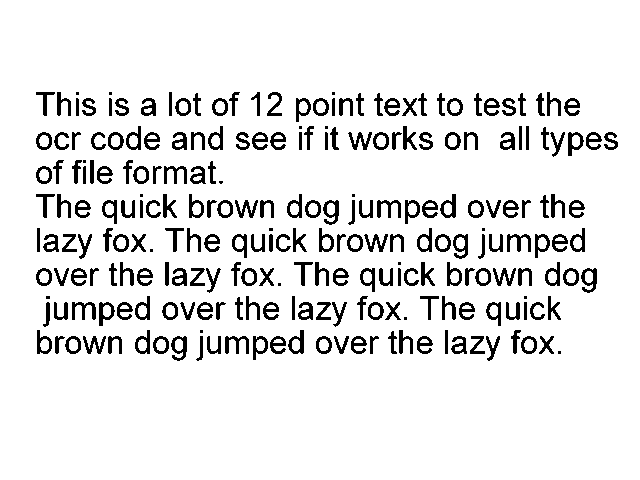

In [3]:
from PIL import Image

image = Image.open("readonly/text.png")
display(image)

In [6]:
import pytesseract
dir(pytesseract)

['Output',
 'TSVNotSupported',
 'TesseractError',
 'TesseractNotFoundError',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__loader__',
 '__name__',
 '__package__',
 '__path__',
 '__spec__',
 'get_tesseract_version',
 'image_to_boxes',
 'image_to_data',
 'image_to_osd',
 'image_to_pdf_or_hocr',
 'image_to_string',
 'pytesseract',
 'run_and_get_output']

In [8]:
help(pytesseract.image_to_string)

Help on function image_to_string in module pytesseract.pytesseract:

image_to_string(image, lang=None, config='', nice=0, output_type='string', timeout=0)
    Returns the result of a Tesseract OCR run on the provided image to string



In [10]:
help(Image.Image.resize)

Help on function resize in module PIL.Image:

resize(self, size, resample=0, box=None)
    Returns a resized copy of this image.
    
    :param size: The requested size in pixels, as a 2-tuple:
       (width, height).
    :param resample: An optional resampling filter.  This can be
       one of :py:attr:`PIL.Image.NEAREST`, :py:attr:`PIL.Image.BOX`,
       :py:attr:`PIL.Image.BILINEAR`, :py:attr:`PIL.Image.HAMMING`,
       :py:attr:`PIL.Image.BICUBIC` or :py:attr:`PIL.Image.LANCZOS`.
       If omitted, or if the image has mode "1" or "P", it is
       set :py:attr:`PIL.Image.NEAREST`.
       See: :ref:`concept-filters`.
    :param box: An optional 4-tuple of floats giving the region
       of the source image which should be scaled.
       The values should be within (0, 0, width, height) rectangle.
       If omitted or None, the entire source is used.
    :returns: An :py:class:`~PIL.Image.Image` object.



In [13]:
# Here's a quick hack if you want to look at the source code of a function
import inspect
src = inspect.getsource(pytesseract.image_to_string)
print(src)

def image_to_string(
    image, lang=None, config='', nice=0, output_type=Output.STRING, timeout=0,
):
    """
    Returns the result of a Tesseract OCR run on the provided image to string
    """
    args = [image, 'txt', lang, config, nice, timeout]

    return {
        Output.BYTES: lambda: run_and_get_output(*(args + [True])),
        Output.DICT: lambda: {'text': run_and_get_output(*args)},
        Output.STRING: lambda: run_and_get_output(*args),
    }[output_type]()



In [0]:
# Another way to do the same in Jupyter
pytesseract.image_to_string??

In [18]:
text = pytesseract.image_to_string(image)
print(text)

This is a lot of 12 point text to test the
ocr code and see if it works on all types
of file format.

The quick brown dog jumped over the
lazy fox. The quick brown dog jumped
over the lazy fox. The quick brown dog
jumped over the lazy fox. The quick
brown dog jumped over the lazy fox.


In [19]:
!wget https://www.pyimagesearch.com/wp-content/uploads/2017/06/example_01.png -O readonly/Noisy_OCR.PNG

--2020-02-22 15:32:45--  https://www.pyimagesearch.com/wp-content/uploads/2017/06/example_01.png
Resolving www.pyimagesearch.com (www.pyimagesearch.com)... 45.33.87.127
Connecting to www.pyimagesearch.com (www.pyimagesearch.com)|45.33.87.127|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 23124 (23K) [image/png]
Saving to: ‘readonly/Noisy_OCR.PNG’

readonly/Noisy_OCR. 100%[===================>]  22.58K  --.-KB/s    in 0s      

2020-02-22 15:32:45 (232 MB/s) - ‘readonly/Noisy_OCR.PNG’ saved [23124/23124]



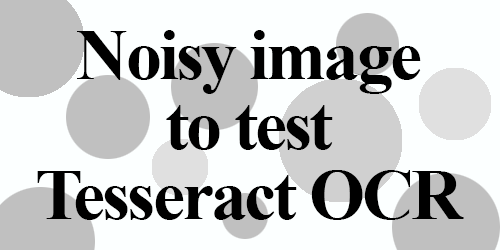

In [20]:
from PIL import Image
img = Image.open("readonly/Noisy_OCR.PNG")
display(img)

In [21]:
import pytesseract
text = pytesseract.image_to_string(Image.open("readonly/Noisy_OCR.PNG"))
print(text)

Noisyimage
to test
Tesseract OCR


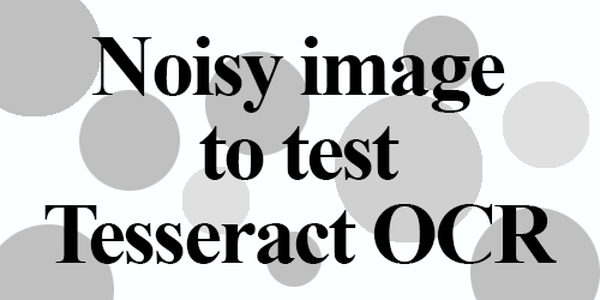

Noisy,image
to test
Tesseract OCR


In [22]:
import PIL 
basewidth = 600 
img = Image.open("readonly/Noisy_OCR.PNG")
wpercent = (basewidth / float(img.size[0]))
hsize = int((float(img.size[1]) * float(wpercent)))
img = img.resize((basewidth, hsize), PIL.Image.ANTIALIAS)
img.save('resized_nois.png')
display(img)
text = pytesseract.image_to_string(Image.open('resized_nois.png')) 
print(text)

In [23]:
img = Image.open('readonly/Noisy_OCR.PNG')
img = img.convert('L')
img.save('greyscale_noise.jpg')
text = pytesseract.image_to_string(Image.open('greyscale_noise.jpg')) 
print(text)

Noisyimage
to test
Tesseract OCR


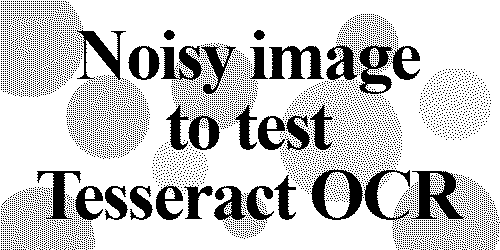

In [25]:
# Lets open the noisy impage and convert it using binarization
img = Image.open('readonly/Noisy_OCR.PNG').convert('1')
img.save('black_white_noise.jpg')
display(img)

Trying with threshold 0


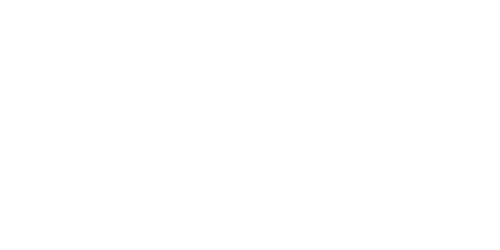


Trying with threshold 64


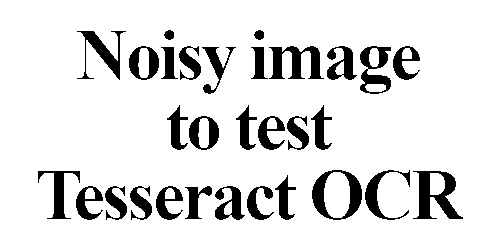

Noisy image
to test
Tesseract OCR
Trying with threshold 128


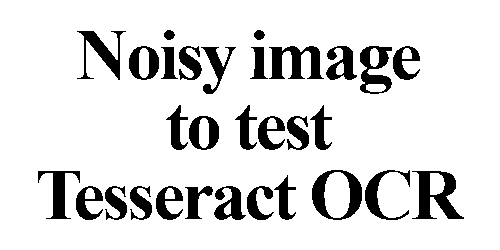

Noisy image
to test
Tesseract OCR
Trying with threshold 192


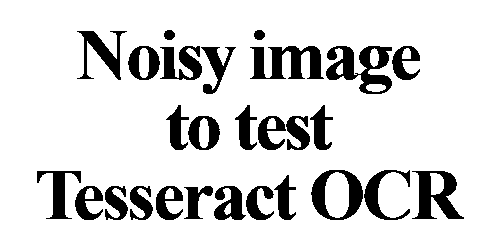

Noisy image
to test
Tesseract OCR
Trying with threshold 256


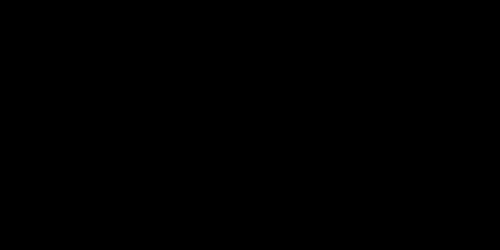

In [27]:
def binarize(image_to_transform, threshold):
    output_image=image_to_transform.convert("L")
    for x in range(output_image.width):
        for y in range(output_image.height):
            if output_image.getpixel((x,y))< threshold:
                output_image.putpixel( (x,y), 0 )
            else:
                output_image.putpixel( (x,y), 255 )
    return output_image

for thresh in range(0,257,64):
    print("Trying with threshold " + str(thresh))
    display(binarize(Image.open('readonly/Noisy_OCR.PNG'), thresh))

    print(pytesseract.image_to_string(binarize(Image.open('readonly/Noisy_OCR.PNG'), thresh)))

## Tesseract and Photographs

In [28]:
!wget http://1.bp.blogspot.com/-o-Kka00bkic/TWRPXZ8xznI/AAAAAAAAEN8/Wu63-llam0I/s1600/ParisStorefront.jpg -O readonly/storefront.jpg

--2020-02-22 15:37:22--  http://1.bp.blogspot.com/-o-Kka00bkic/TWRPXZ8xznI/AAAAAAAAEN8/Wu63-llam0I/s1600/ParisStorefront.jpg
Resolving 1.bp.blogspot.com (1.bp.blogspot.com)... 74.125.134.132, 2607:f8b0:400c:c00::84
Connecting to 1.bp.blogspot.com (1.bp.blogspot.com)|74.125.134.132|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 341272 (333K) [image/jpeg]
Saving to: ‘readonly/storefront.jpg’

readonly/storefront 100%[===================>] 333.27K  --.-KB/s    in 0.002s  

2020-02-22 15:37:22 (204 MB/s) - ‘readonly/storefront.jpg’ saved [341272/341272]



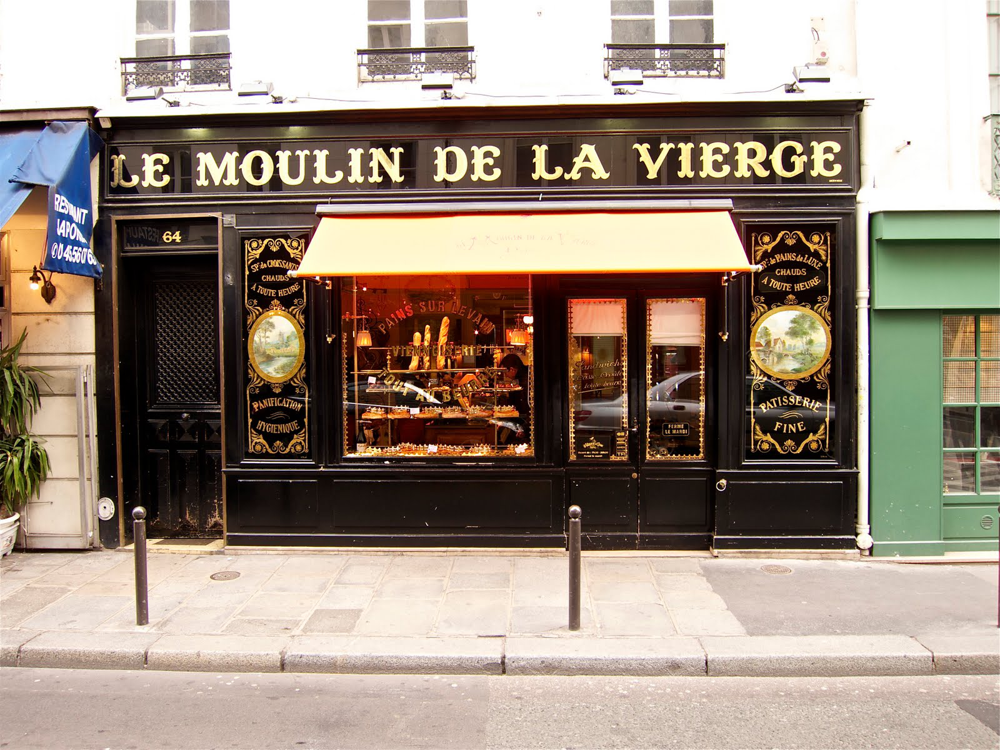

''

In [29]:
from PIL import Image
import pytesseract
image=Image.open('readonly/storefront.jpg')
display(image)
pytesseract.image_to_string(image)

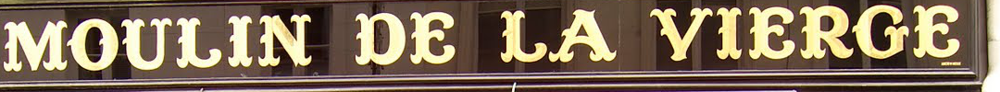

'MOULIN DE LA VIERGE |'

In [43]:
bounding_box=(310, 220, 1390, 320)
title_image=image.crop(bounding_box)
display(title_image)
pytesseract.image_to_string(title_image)

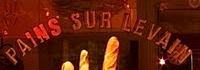

In [53]:
bounding_box=(600, 470, 800, 540)

little_sign=image.crop(bounding_box)
display(little_sign)

In [54]:
new_size=(little_sign.width*10,little_sign.height*10)
help(little_sign.resize)

Help on method resize in module PIL.Image:

resize(size, resample=0, box=None) method of PIL.Image.Image instance
    Returns a resized copy of this image.
    
    :param size: The requested size in pixels, as a 2-tuple:
       (width, height).
    :param resample: An optional resampling filter.  This can be
       one of :py:attr:`PIL.Image.NEAREST`, :py:attr:`PIL.Image.BOX`,
       :py:attr:`PIL.Image.BILINEAR`, :py:attr:`PIL.Image.HAMMING`,
       :py:attr:`PIL.Image.BICUBIC` or :py:attr:`PIL.Image.LANCZOS`.
       If omitted, or if the image has mode "1" or "P", it is
       set :py:attr:`PIL.Image.NEAREST`.
       See: :ref:`concept-filters`.
    :param box: An optional 4-tuple of floats giving the region
       of the source image which should be scaled.
       The values should be within (0, 0, width, height) rectangle.
       If omitted or None, the entire source is used.
    :returns: An :py:class:`~PIL.Image.Image` object.



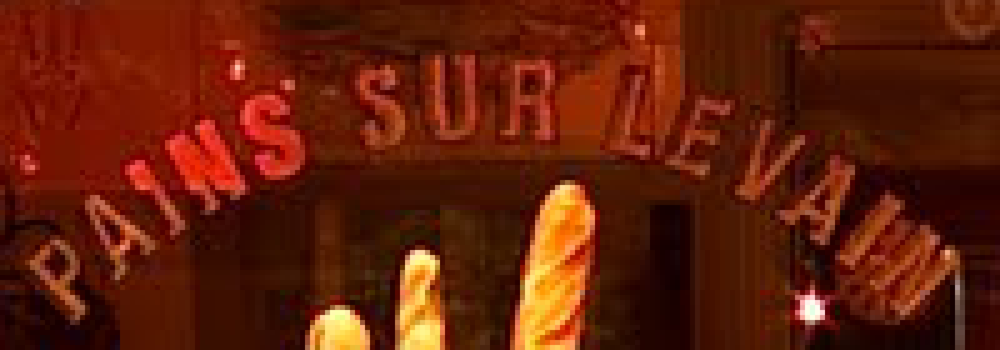

In [55]:
display(little_sign.resize( new_size, Image.NEAREST))

0


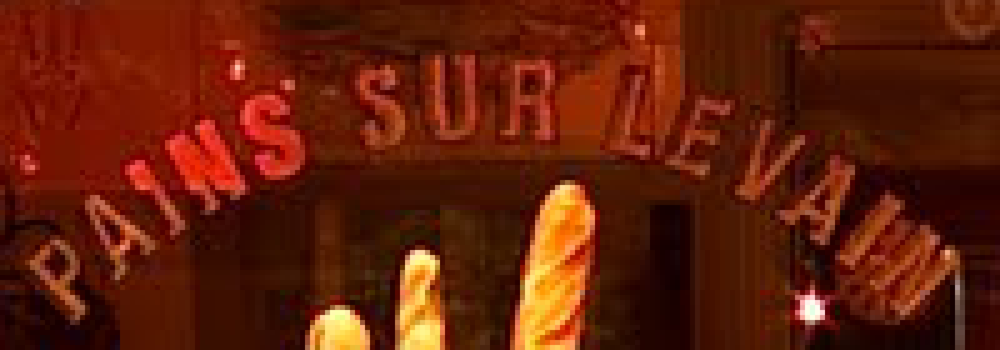

4


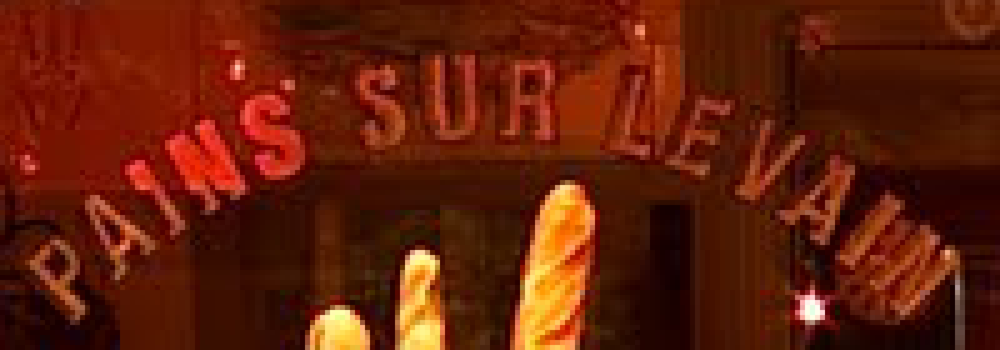

2


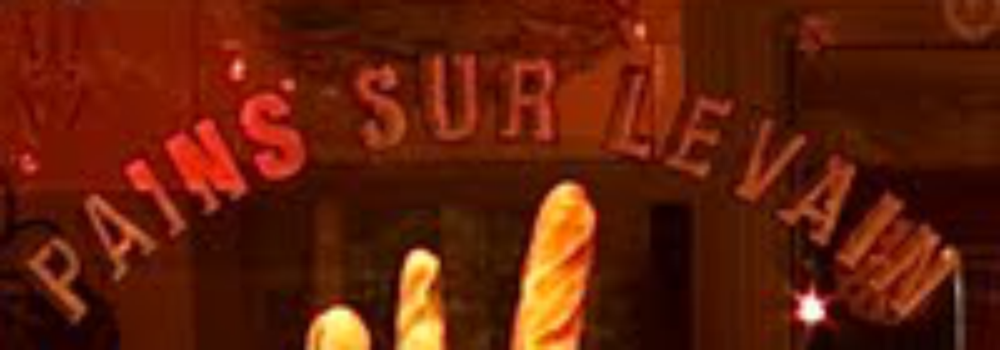

5


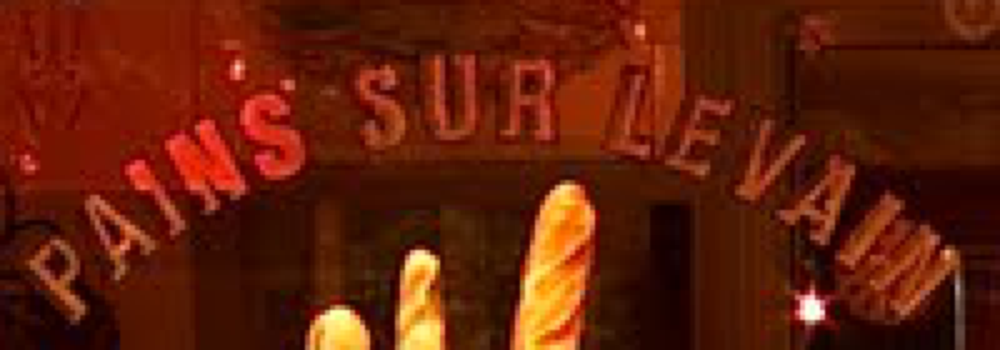

3


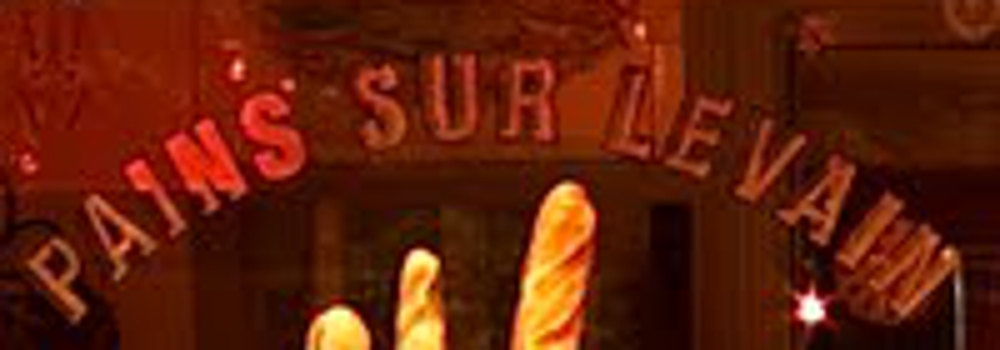

1


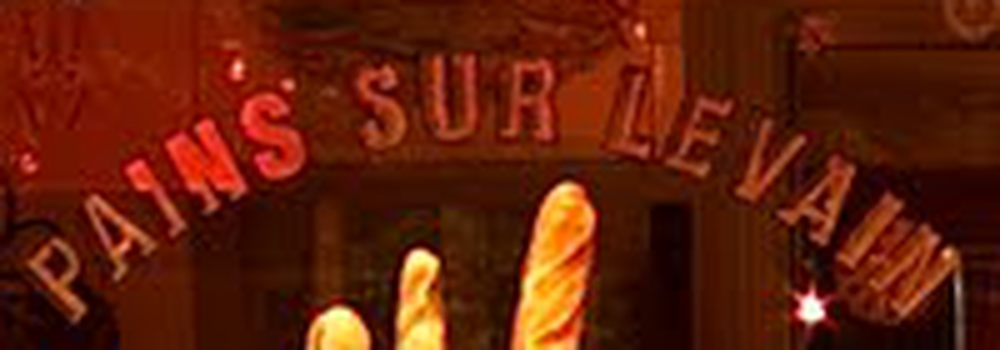

In [56]:
options=[Image.NEAREST, Image.BOX, Image.BILINEAR, Image.HAMMING, Image.BICUBIC, Image.LANCZOS]
for option in options:
    print(option)
    display(little_sign.resize( new_size, option))

In [57]:
bigger_sign=little_sign.resize(new_size, Image.BICUBIC)
pytesseract.image_to_string(bigger_sign)

''

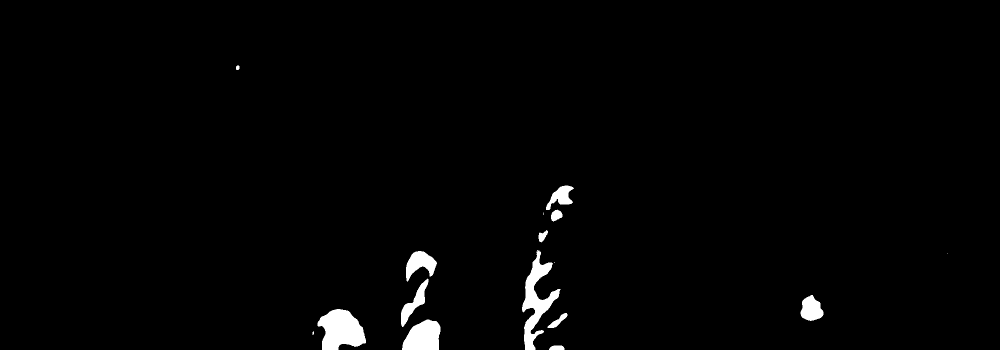

''

In [58]:
def binarize(image_to_transform, threshold):
    output_image=image_to_transform.convert("L")
    for x in range(output_image.width):
        for y in range(output_image.height):
            if output_image.getpixel((x,y))< threshold:
                output_image.putpixel( (x,y), 0 )
            else:
                output_image.putpixel( (x,y), 255 )
    return output_image

binarized_bigger_sign=binarize(bigger_sign, 190)
display(binarized_bigger_sign)
pytesseract.image_to_string(binarized_bigger_sign)

In [59]:
eng_dict=[]
with open ("readonly/words_alpha.txt", "r") as f:
    data=f.read()
    eng_dict=data.split("\n")

for i in range(150,170):
    strng=pytesseract.image_to_string(binarize(bigger_sign,i))
    strng=strng.lower()
    import string
    comparison=''
    for character in strng:
        if character in string.ascii_lowercase:
            comparison=comparison+character
    if comparison in eng_dict:
        print(comparison)

FileNotFoundError: ignored

## Jupyter Widgets (Optional)

In [60]:
from PIL import Image, ImageDraw
from ipywidgets import interact

image=Image.open('readonly/storefront.jpg')

@interact(left=100, top=100, right=200, bottom=200)

def draw_border(left, top, right, bottom):
    img=image.copy()
    drawing_object=ImageDraw.Draw(img)
    drawing_object.rectangle((left,top,right,bottom), fill = None, outline ='red')
    display(img)

interactive(children=(IntSlider(value=100, description='left', max=300, min=-100), IntSlider(value=100, descri…